In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import gget
from tqdm import tqdm
from scipy.stats import ttest_ind
import matplotlib.colors as mcolors
import os
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

import rapids_singlecell as rsc
import anndata as an
import scanpy as sc
import scvi
from cuml import UMAP

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# GO Functions

In [2]:
def get_genes_from_go_path(go_pathname, file_path="../../../resources/GO_Biological_Process_2023.txt"):
    """
    Reads a tab-delimited file where each line starts with a GO pathway name,
    then returns a list of genes in the row where the pathway name matches `go_pathname`.
    """
    with open(file_path, 'r') as f:
        for line in f:
            # Remove newline and split by tab
            parts = line.strip().split('\t')
            # The first column is the pathway name
            if parts[0].strip() == go_pathname.strip():
                # Genes are all non-empty fields after the first two columns
                # (since there are 2 tabs after the pathway name in your file)
                genes = [x for x in parts[2:] if x]
                return genes
    return []

def search_go_pathways(search_str, file_path="../../../resources/GO_Biological_Process_2023.txt"):
    """
    Returns a list of pathway names containing `search_str` (case-insensitive).
    """
    pathways = []
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split('\t')
            if search_str.lower() in parts[0].lower():
                pathways.append(parts[0])
    return pathways


def pathways_with_genes(gene_list, file_path="../../../resources/GO_Biological_Process_2023.txt"):
    """
    Returns all pathways where every gene in `gene_list` is present in that pathway's gene set.
    """
    results = []
    genes_set = set(gene_list)
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split('\t')
            pathway = parts[0]
            # Genes start after two tab columns
            pathway_genes = set([x for x in parts[2:] if x])
            if genes_set.issubset(pathway_genes):
                results.append(pathway)
    return results


results = search_go_pathways("cell cycle")
print("First 5 pathways containing 'cell cycle':")
print(results[:5])

gene_list = get_genes_from_go_path(results[0])
print(f"\nGenes in pathway '{results[0]}':")
print(gene_list)

results_with_cd34 = pathways_with_genes(['CD34'])
print("\nFirst 5 pathways containing gene 'CD34':")
print(results_with_cd34[:5])

First 5 pathways containing 'cell cycle':
['DNA Damage Response, Signal Transduction By P53 Class Mediator Resulting In Cell Cycle Arrest (GO:0006977)', 'G1/S Transition Of Mitotic Cell Cycle (GO:0000082)', 'G2/M Transition Of Mitotic Cell Cycle (GO:0000086)', 'Cell Cycle G1/S Phase Transition (GO:0044843)', 'Cell Cycle G2/M Phase Transition (GO:0044839)']

Genes in pathway 'DNA Damage Response, Signal Transduction By P53 Class Mediator Resulting In Cell Cycle Arrest (GO:0006977)':
['CDKN1B', 'GML', 'CDKN1A', 'PLK3', 'CRADD', 'PLK2', 'TRIAP1', 'PML', 'MUC1', 'PRAP1', 'CHEK2', 'CASP2', 'RPL26', 'GTSE1', 'PIDD1', 'TP53', 'MDM2']

First 5 pathways containing gene 'CD34':
['Angiogenesis Involved In Wound Healing (GO:0060055)', 'Cell-Matrix Adhesion (GO:0007160)', 'Endothelial Cell Proliferation (GO:0001935)', 'Endothelium Development (GO:0003158)', 'Epithelium Development (GO:0060429)']


# Load gene sets

In [3]:
# load tfs so I got 'em
fpath = "../../../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
tf_list[:5]

['ZNF354C', 'KLF12', 'ZNF143', 'ZIC2', 'ZNF274']

In [4]:
fpath = "../../../resources/clean_marker_genes.csv"
mdf = pd.read_csv(fpath)
mdf['val'] = 1
print(mdf.head().to_string(index=False))

gene_name         cell_type  is_tf  source    category  val
   TSPAN8 endothelial_cells  False panglao endothelial    1
     KLK1 endothelial_cells  False panglao endothelial    1
   RNASE1 endothelial_cells  False panglao endothelial    1
      LUM endothelial_cells  False panglao endothelial    1
      LOX endothelial_cells  False panglao endothelial    1


In [5]:
mdf_pivot = pd.pivot_table(
    mdf, 
    index=['gene_name',],
    columns=['source', 'category'],
    values='val',
    fill_value=0
)

mdf_pivot.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in mdf_pivot.columns]

mdf_pivot.head()

,panglao_endothelial,panglao_fibroblast,panglao_hematopoietic,tabula_endothelial,tabula_fibroblast,tabula_hematopoietic
gene_name,,,,,,
A2M,1.0,0.0,0.0,1.0,1.0,0.0
ABCA8,1.0,0.0,0.0,0.0,0.0,0.0
ABCB1,0.0,0.0,1.0,0.0,0.0,0.0
ABCG2,1.0,0.0,1.0,0.0,0.0,0.0
ABI3,0.0,1.0,0.0,0.0,0.0,0.0


# Load data

In [6]:
### %%time
dpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/scMINER/hsc_clusters/SJARACNe/"
alpha = 0.01

clusters = ["C1", "C2", "C3", "C4", "C5"]

df_list = []

for c in clusters:
    fpath = f"{dpath}{c}/output/consensus_network_ncol_.txt"
    df = pd.read_csv(fpath, sep='\t')
    df = df.drop(columns=['source.symbol', 'target.symbol'])
    df['cluster'] = c
    df['sig'] = (df['p-value'] <= alpha)
    df_list.append(df)

df = pd.concat(df_list)
df['pair'] = df['source'] + " → " + df['target']
print(f"{df.shape=}")
print(df.head().to_string())

df.shape=(1044554, 10)
  source   target      MI  pearson  spearman   slope  p-value cluster    sig            pair
0   AATF    ACSL4  0.1007   0.1194    0.1096  0.2190   0.0005      C1   True    AATF → ACSL4
1   AATF  ADAMTS1  0.0917   0.1336    0.1242  0.9153   0.0001      C1   True  AATF → ADAMTS1
2   AATF    ADAT1  0.1066   0.1291    0.1187  0.1188   0.0002      C1   True    AATF → ADAT1
3   AATF  ADIPOR1  0.1037   0.1732    0.1417  0.2654   0.0000      C1   True  AATF → ADIPOR1
4   AATF   ANP32E  0.0888   0.0598    0.0978  0.0922   0.0842      C1  False   AATF → ANP32E


# Simple filtering

In [7]:
print(f"Original edges: {len(df)}")

# Filter source
df = df[~df['source'].str.startswith("MT")]
df = df[~df['source'].str.startswith("RP")]
print(f"After source filter: {len(df)} edges")

# Filter target
df = df[~df['target'].str.startswith("MT")]
df = df[~df['target'].str.startswith("RP")]
print(f"After target filter: {len(df)} edges")

# Reset index
df = df.reset_index(drop=True)
print("Index reset.\n")

# Show preview
print(df.head())


Original edges: 1044554
After source filter: 1040085 edges
After target filter: 997109 edges
Index reset.

  source   target      MI  pearson  spearman   slope  p-value cluster    sig  \
0   AATF    ACSL4  0.1007   0.1194    0.1096  0.2190   0.0005      C1   True   
1   AATF  ADAMTS1  0.0917   0.1336    0.1242  0.9153   0.0001      C1   True   
2   AATF    ADAT1  0.1066   0.1291    0.1187  0.1188   0.0002      C1   True   
3   AATF  ADIPOR1  0.1037   0.1732    0.1417  0.2654   0.0000      C1   True   
4   AATF   ANP32E  0.0888   0.0598    0.0978  0.0922   0.0842      C1  False   

             pair  
0    AATF → ACSL4  
1  AATF → ADAMTS1  
2    AATF → ADAT1  
3  AATF → ADIPOR1  
4   AATF → ANP32E  


# Re-structure

In [8]:
%%time 
pdf = df.copy()

pdf = pd.pivot_table(
    pdf,
    index=['source', 'target'],
    columns=['cluster'],
    values=['MI', 'pearson', 'spearman', 'sig'],
    fill_value=0
)

# Flatten multi-index columns by joining with underscore
pdf.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in pdf.columns]
pdf = pdf.reset_index()
print(f"{pdf.shape=}")
print(pdf.columns)

print(pdf[['source', 'target', 'MI_C1', 'MI_C2', 'MI_C3', 'MI_C4', 'MI_C5',]].head().to_string())

pdf.shape=(873371, 22)
Index(['source', 'target', 'MI_C1', 'MI_C2', 'MI_C3', 'MI_C4', 'MI_C5',
       'pearson_C1', 'pearson_C2', 'pearson_C3', 'pearson_C4', 'pearson_C5',
       'sig_C1', 'sig_C2', 'sig_C3', 'sig_C4', 'sig_C5', 'spearman_C1',
       'spearman_C2', 'spearman_C3', 'spearman_C4', 'spearman_C5'],
      dtype='object')
  source target  MI_C1   MI_C2   MI_C3   MI_C4  MI_C5
0   AATF  ABCF3    0.0  0.0841  0.0000  0.0000    0.0
1   AATF   ABI1    0.0  0.0000  0.1088  0.0000    0.0
2   AATF  ACBD4    0.0  0.0000  0.0689  0.0000    0.0
3   AATF  ACIN1    0.0  0.0000  0.0000  0.0839    0.0
4   AATF   ACO1    0.0  0.0000  0.0000  0.0863    0.0
CPU times: user 749 ms, sys: 314 ms, total: 1.06 s
Wall time: 1.07 s


In [9]:
# add foldchanges

mi_cols = ['MI_C1', 'MI_C2', 'MI_C3', 'MI_C4', 'MI_C5']
fc_columns = []
# Compute log2 fold change of each value vs. mean of other columns in the row
for col in mi_cols:
    others = [c for c in mi_cols if c != col]
    new_column = f'log2FC_{col.replace("MI_", "")}'
    pdf[new_column] = np.log2((pdf[col] + 1) / (pdf[others].mean(axis=1) + 1))
    fc_columns.append(new_column)

print(pdf[['source', 'target'] + fc_columns].head().to_string())

  source target  log2FC_C1  log2FC_C2  log2FC_C3  log2FC_C4  log2FC_C5
0   AATF  ABCF3  -0.030018   0.116498  -0.030018  -0.030018  -0.030018
1   AATF   ABI1  -0.038717  -0.038717   0.148999  -0.038717  -0.038717
2   AATF  ACBD4  -0.024639  -0.024639   0.096127  -0.024639  -0.024639
3   AATF  ACIN1  -0.029948  -0.029948  -0.029948   0.116232  -0.029948
4   AATF   ACO1  -0.030795  -0.030795  -0.030795   0.119423  -0.030795


In [10]:
tdf = pdf.copy()
tdf = tdf[tdf['source'].isin(tf_list)]
tdf = tdf[tdf['target'].isin(tf_list)]
print(f"{tdf.shape=}")
tdf.head()

tdf.shape=(48398, 27)


,source,target,MI_C1,MI_C2,MI_C3,MI_C4,MI_C5,pearson_C1,pearson_C2,pearson_C3,...,spearman_C1,spearman_C2,spearman_C3,spearman_C4,spearman_C5,log2FC_C1,log2FC_C2,log2FC_C3,log2FC_C4,log2FC_C5
664,ADNP,ABL1,0.1479,0.0000,0.0,0.1114,0.0000,0.3373,0.0000,0.0,...,0.2830,0.0000,0.0,0.1385,0.0000,0.159367,-0.090616,-0.090616,0.099997,-0.090616
681,ADNP,AFF4,0.1576,0.1031,0.0,0.0000,0.0000,0.2735,0.1741,0.0,...,0.2456,0.1852,0.0,0.0000,0.0000,0.174423,0.085813,-0.091090,-0.091090,-0.091090
683,ADNP,AGMAT,0.0000,0.0000,0.0,0.0000,0.0718,0.0000,0.0000,0.0,...,0.0000,0.0000,0.0,0.0000,0.0375,-0.025667,-0.025667,-0.025667,-0.025667,0.100036
684,ADNP,AHCTF1,0.0000,0.1055,0.0,0.0000,0.0000,0.0000,0.1923,0.0,...,0.0000,0.1513,0.0,0.0000,0.0000,-0.037558,0.144699,-0.037558,-0.037558,-0.037558
685,ADNP,AHDC1,0.0000,0.0000,0.0,0.0979,0.0000,0.0000,0.0000,0.0,...,0.0000,0.0000,0.0,0.1446,0.0000,-0.034885,-0.034885,-0.034885,0.134747,-0.034885


# Build graph

In [11]:
%%time
G = nx.from_pandas_edgelist(
    # tdf, # could be pdf for all interactions
    pdf, # could be tdf for tf-tf interactions
    edge_attr=True,
    create_using=nx.DiGraph(),
)

nx.set_node_attributes(G, {n: True for n in tf_list if n in G}, 'is_tf')

attrs = nx.get_node_attributes(G, 'is_tf')
n_true = sum(attrs.values())
n_total = G.number_of_nodes()

print(f"{n_true} / {n_total} nodes are TFs")

print(G)

1484 / 21157 nodes are TFs
DiGraph with 21157 nodes and 873371 edges
CPU times: user 3.95 s, sys: 458 ms, total: 4.41 s
Wall time: 4.42 s


# Get Expression Data

In [12]:
%%time

# File path
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
print(f"Loading AnnData from: {fpath}")
adata = sc.read_h5ad(fpath)

# Use log-normalized layer
adata.X = adata.layers['log_norm'].copy()
print("Set `adata.X` to 'log_norm' layer.")

# Filter genes to match nodes in the graph
nodes = list(G.nodes())
print(f"Filtering genes to {len(nodes)} nodes in the graph...")
adata = adata[:, nodes].copy()

# Extract expression matrix and cluster labels
expr_df = adata.to_df()
clusters = adata.obs['cluster_str']
print(f"Expression matrix shape: {expr_df.shape}")
print(f"Number of unique clusters: {clusters.nunique()}")

# Compute mean and non-zero percentage per gene per cluster
stats = {}
for clust in clusters.unique():
    print(f"Processing cluster: {clust}")
    mask = clusters == clust
    X_cluster = expr_df[mask]
    stats[f'mean_{clust}'] = X_cluster.mean()
    stats[f'nonzero_pct_{clust}'] = (X_cluster > 0).sum() / X_cluster.shape[0] * 100

# Combine stats into a single DataFrame
X = pd.DataFrame(stats)
X.index.name = 'gene'

# Convert the DataFrame to a dict-of-dicts: {node: {attr_name: value, ...}, ...}
attr_dict = X.to_dict(orient='index')
nx.set_node_attributes(G, attr_dict)

print(f"Final stats shape: {X.shape}")
print("Columns in output:")
print(X.columns.tolist())
print(X.head().to_string())

Loading AnnData from: /nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad
Set `adata.X` to 'log_norm' layer.
Filtering genes to 21157 nodes in the graph...
Expression matrix shape: (15867, 21157)
Number of unique clusters: 5
Processing cluster: C3
Processing cluster: C4
Processing cluster: C5
Processing cluster: C2
Processing cluster: C1
Final stats shape: (21157, 10)
Columns in output:
['mean_C3', 'nonzero_pct_C3', 'mean_C4', 'nonzero_pct_C4', 'mean_C5', 'nonzero_pct_C5', 'mean_C2', 'nonzero_pct_C2', 'mean_C1', 'nonzero_pct_C1']
        mean_C3  nonzero_pct_C3   mean_C4  nonzero_pct_C4   mean_C5  nonzero_pct_C5   mean_C2  nonzero_pct_C2   mean_C1  nonzero_pct_C1
gene                                                                                                                                   
AATF   0.135796       20.504253  0.218729       37.992750  0.160086       22.429907  0.117485       17.143948  0.124763       22.302158
ABCF3  0.101

# Subnetworks

Filtered gene list (in graph): 93 genes


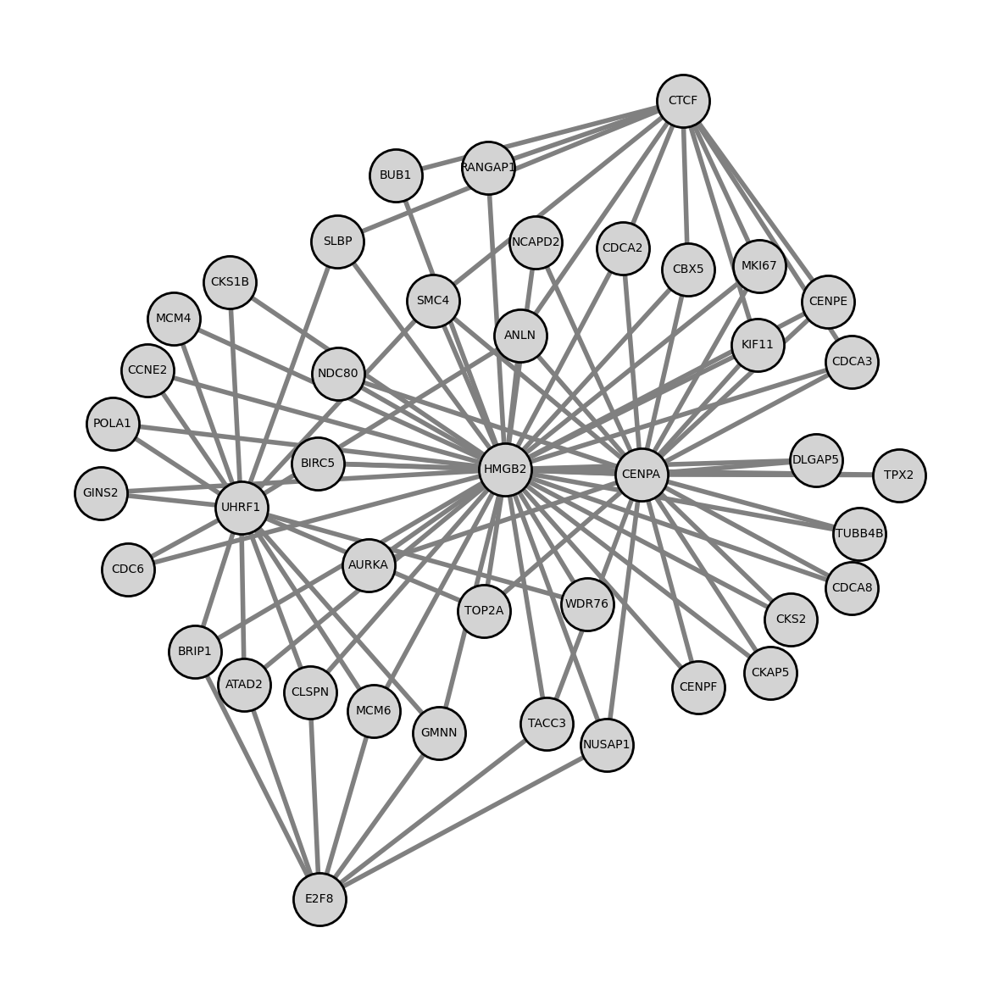

In [13]:
def get_top_degree_subgraph_and_layout_from_genes(G, gene_list_input, top_pct=0.10, seed_value=142):
    """
    Returns subgraph H and layout pos for top-degree nodes among input genes.
    """
    # Filter to nodes present in graph
    gene_list = [n for n in gene_list_input if n in G]
    print(f"Filtered gene list (in graph): {len(gene_list)} genes")

    # Subgraph
    H = G.subgraph(gene_list).copy()

    if H.number_of_nodes() == 0:
        print("Warning: No nodes from input gene list found in graph.")
        return None, None

    # Compute degree for each node in H
    node_degrees = dict(H.degree())
    n_top = max(1, int(np.ceil(len(node_degrees) * top_pct)))

    # Get top X% nodes by degree
    top_nodes = sorted(node_degrees, key=node_degrees.get, reverse=True)[:n_top]

    # Subgraph with top-degree nodes only
    H = H.subgraph(top_nodes).copy()

    # Ensure only a single edge between any two nodes (undirected)
    H = nx.Graph(H)

    # Take largest connected component if exists
    if H.number_of_nodes() > 0:
        largest_cc_nodes = max(nx.connected_components(H), key=len)
        H = H.subgraph(largest_cc_nodes).copy()
    else:
        print("Warning: Subgraph is empty after filtering top nodes.")

    # Layout
    if H.number_of_nodes() > 0:
        pos = graphviz_layout(H, prog='neato', args=f"-Gstart={seed_value}")
    else:
        pos = {}
    return H, pos

def plot_graph_plain(H, pos):
    """
    Simple plotting for a graph H using layout pos.
    """
    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 6, 6

    nx.draw_networkx_edges(
        H, pos,
        width=2,
        edge_color='grey',
        arrows=False
    )
    nx.draw_networkx_nodes(
        H, pos,
        node_size=500,
        node_color='lightgrey',
        edgecolors='k',
        linewidths=1,
    )
    nx.draw_networkx_labels(H, pos, font_size=5)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


fpath = "../../../resources/regev_lab_cell_cycle_genes.txt"
gene_list_input = [x.strip() for x in open(fpath)]

H, pos = get_top_degree_subgraph_and_layout_from_genes(
    G, 
    gene_list_input,
    top_pct=0.45,
)

plot_graph_plain(H, pos)

Filtered gene list (in graph): 93 genes


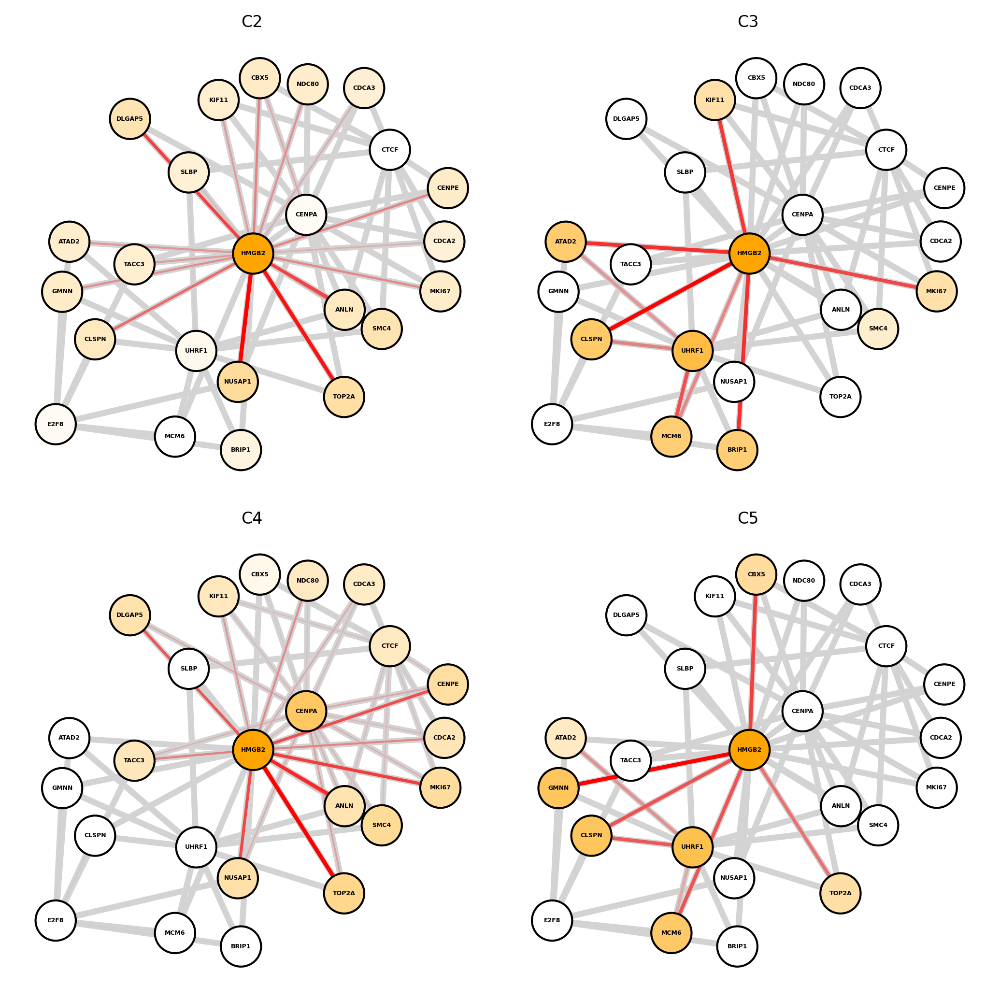

In [29]:
def make_bright_reds_colormap():
    return LinearSegmentedColormap.from_list('lightgrey_black', ['w', 'orange'])

def make_lightgrey_black_colormap():
    return LinearSegmentedColormap.from_list('lightgrey_black', ['lightgrey', 'r'])

def compute_node_values(H, edge_attr):
    ec = nx.eigenvector_centrality(H, max_iter=1000, weight=edge_attr)
    node_values = np.array([ec[n] for n in H.nodes()])
    vmin, vmax = node_values.min(), node_values.max()
    return node_values, vmin, vmax

def draw_edges(H, pos, edge_attr, ax, width_scale=2.0):
    # Background edges
    nx.draw_networkx_edges(
        H, pos,
        edgelist=list(H.edges()),
        edge_color='lightgrey',
        width=3,
        arrows=False,
        ax=ax
    )
    # Foreground edges with weights
    edges_with_weight = [(e, H.edges[e][edge_attr]) for e in H.edges() if H.edges[e][edge_attr] > 0]
    if edges_with_weight:
        edges_with_weight = sorted(edges_with_weight, key=lambda x: x[1])
        edgelist, edgeweights = zip(*edges_with_weight)
        edge_cmap = make_lightgrey_black_colormap()
        k = width_scale / max(edgeweights)
        edgewidths = [k * w for w in edgeweights]
        nx.draw_networkx_edges(
            H, pos,
            edgelist=edgelist,
            edge_color=edgewidths,
            width=edgewidths,
            edge_cmap=edge_cmap,
            alpha=1.0,
            arrows=False,
            ax=ax,
        )

def draw_nodes_and_labels(H, pos, node_values, vmin, vmax, ax, cluster):
    node_cmap = make_bright_reds_colormap()
    nx.draw_networkx_nodes(
        H, pos,
        node_color=node_values,
        node_size=400,
        cmap=node_cmap,
        edgecolors='k',
        linewidths=1.,
        vmin=vmin,
        vmax=vmax,
        ax=ax,
    )
    nx.draw_networkx_labels(
        H, pos, 
        font_size=3,
        font_weight='bold',
        ax=ax,
    )
    ax.set_title(f"{cluster}", fontsize=8)
    ax.axis('off')

def plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'], figsize=(7, 7)):
    plt.rcParams['figure.dpi'] = 300
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.ravel()
    for i, cluster in enumerate(clusters):
        edge_attr = f'MI_{cluster}'
        node_values, vmin, vmax = compute_node_values(H, edge_attr)
        draw_edges(H, pos, edge_attr, axes[i])
        draw_nodes_and_labels(H, pos, node_values, vmin, vmax, axes[i], cluster)
        axes[i].set_facecolor('none')   
    fig.patch.set_facecolor('none')    # Figure background transparent
    plt.tight_layout()
    plt.show()

fpath = "../../../resources/regev_lab_cell_cycle_genes.txt"
gene_list_input = [x.strip() for x in open(fpath)]

H, pos = get_top_degree_subgraph_and_layout_from_genes(
    G, 
    gene_list_input,
    top_pct=0.25,
)

plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'])

Filtered gene list (in graph): 26 genes


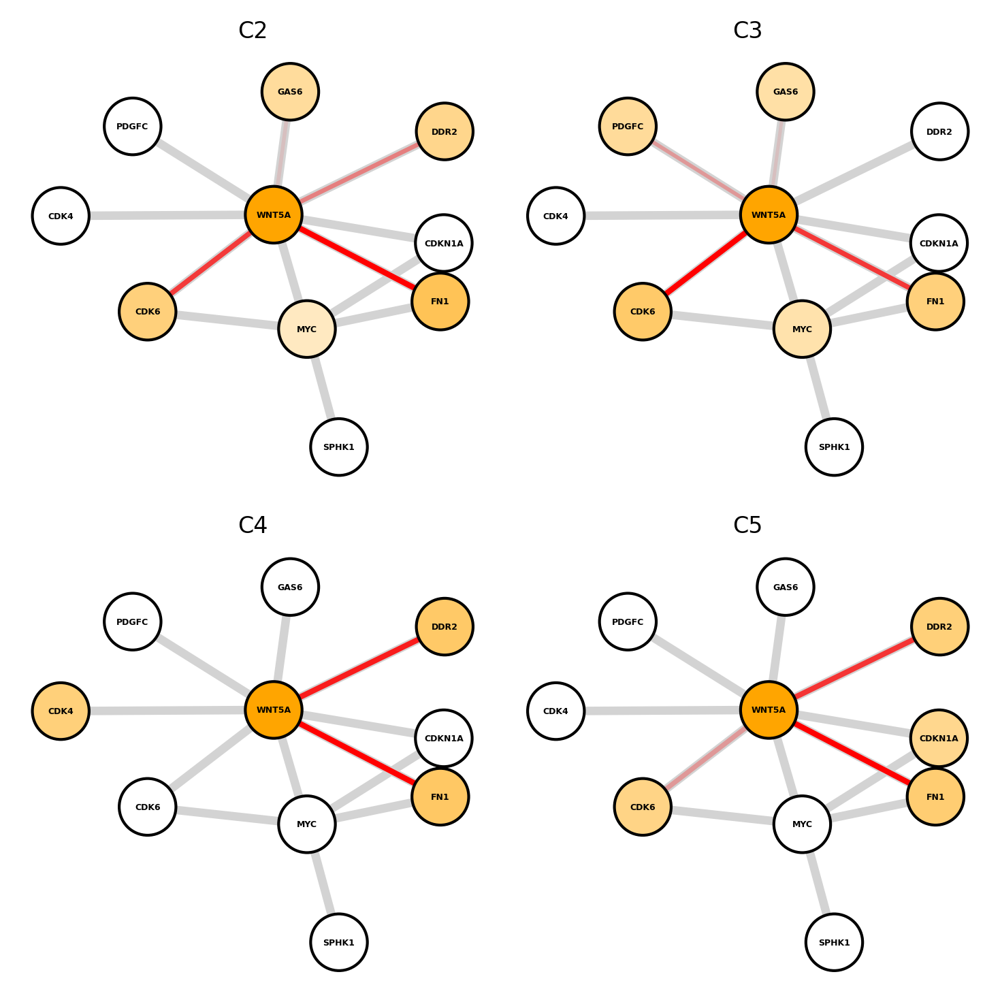

In [30]:
query = 'Positive Regulation Of Fibroblast Proliferation (GO:0048146)'
gene_list = get_genes_from_go_path(query)

H, pos = get_top_degree_subgraph_and_layout_from_genes(
    G, gene_list,
    top_pct=1.0,
)

plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'], figsize=(5, 5))

In [18]:
results = search_go_pathways("chromatin")
results[:10]

['CENP-A Containing Chromatin Assembly (GO:0034080)',
 'DNA Methylation-Dependent Heterochromatin Formation (GO:0006346)',
 'DNA Repair-Dependent Chromatin Remodeling (GO:0140861)',
 'DNA Replication-Dependent Chromatin Assembly (GO:0006335)',
 'Chromatin Organization (GO:0006325)',
 'Chromatin Remodeling (GO:0006338)',
 'Chromatin Remodeling At Centromere (GO:0031055)',
 'Constitutive Heterochromatin Formation (GO:0140719)',
 'Establishment Of Protein Localization To Chromatin (GO:0071169)',
 'Facultative Heterochromatin Formation (GO:0140718)']

['SMARCA1', 'PCGF6', 'PIH1D1', 'DEK', 'GATAD2A', 'SMARCA2', 'SMARCA4', 'GATAD2B', 'SMARCA5', 'DEPDC1B', 'APLF', 'ASF1A', 'HNRNPC', 'BCOR', 'CGGBP1', 'RB1', 'RNF2', 'SMARCB1', 'ZNF274', 'SATB1', 'SATB2', 'IWS1', 'RNF8', 'MTA1', 'TFPT', 'MTA2', 'CHEK1', 'IFI16', 'ZNF827', 'MYC', 'MTA3', 'SF3B1', 'PHC1', 'ZBTB7A', 'DAXX', 'ACTL6A', 'ACTL6B', 'INO80', 'MTHFR', 'BAZ1A', 'BAZ1B', 'HCFC1', 'HCFC2', 'SRPK2', 'UCHL5', 'H1-8', 'C6ORF89', 'PADI4', 'SNAI1', 'EZH1', 'PADI2', 'PAXIP1', 'PHB1', 'BAZ2A', 'ZBTB1', 'BAZ2B', 'MYSM1', 'ZNHIT1', 'KAT5', 'DPF1', 'DPF2', 'DPF3', 'MIER1', 'SOX9', 'SKP1', 'SS18', 'MCRS1', 'PHF10', 'RING1', 'SIRT7', 'TET1', 'SIRT2', 'TAF6L', 'KAT2B', 'TADA2A', 'KAT2A', 'TADA2B', 'MTF2', 'SUV39H2', 'PRDM16', 'CTCF', 'BMI1', 'CHRAC1', 'BABAM1', 'MECOM', 'H1-9P', 'SUDS3', 'H3C1', 'JARID2', 'LIN54', 'NPM1', 'NPM2', 'NPM3', 'PARP2', 'PBRM1', 'MBD2', 'MBD3', 'CHD1L', 'PER2', 'RYBP', 'MYBBP1A', 'PER1', 'TRIP12', 'WAC', 'HDGF', 'ZNF335', 'BRDT', 'FOXA1', 'SETD4', 'SETD7', 'PHF1', 'RSF1

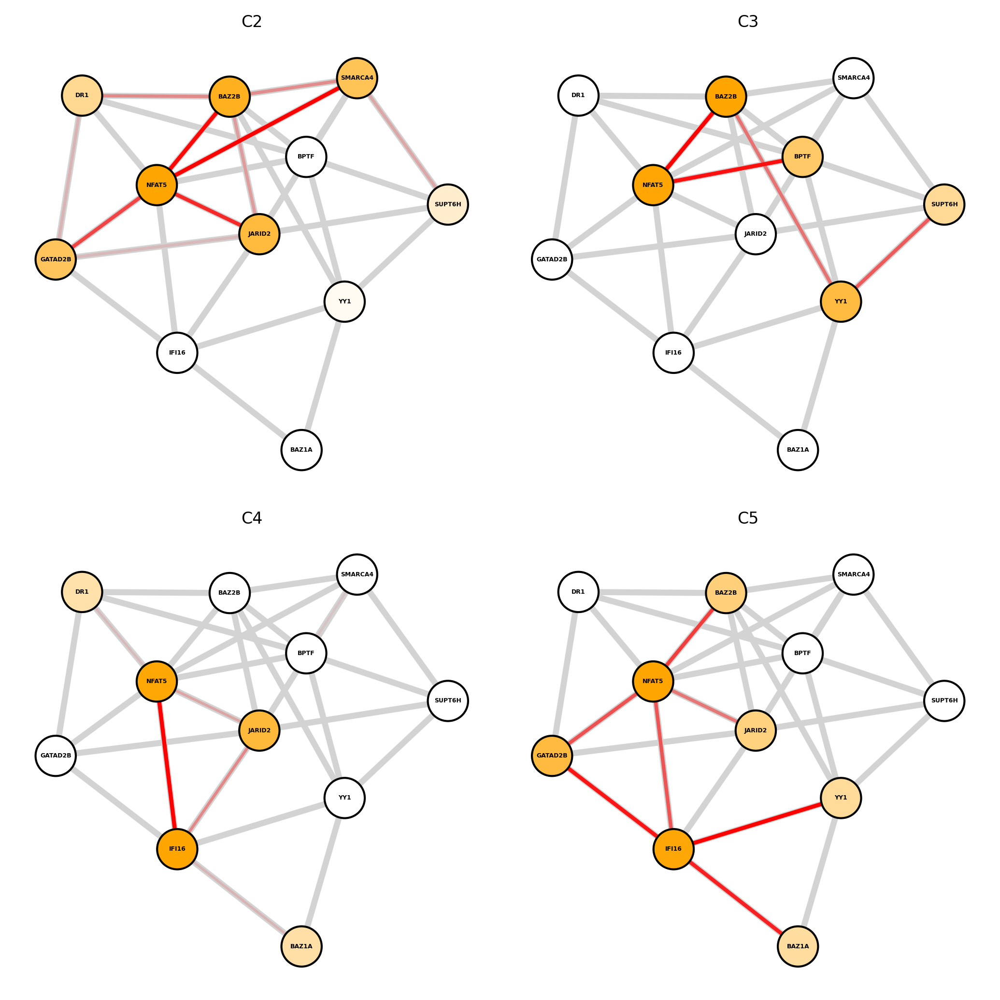

In [67]:
query = 'Chromatin Remodeling (GO:0006338)'
gene_list = get_genes_from_go_path(query)
print(gene_list)

H, pos = get_top_degree_subgraph_and_layout_from_genes(
    G, gene_list,
    top_pct=0.05,
)

plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'])

# Query Node

Converted input graph to undirected.
Found 696 nodes within 1 steps of 'REL'.
Selected top 70 nodes by degree (top 10.0%).
Subgraph reduced to largest connected component (70 nodes).
Graph with 70 nodes and 790 edges


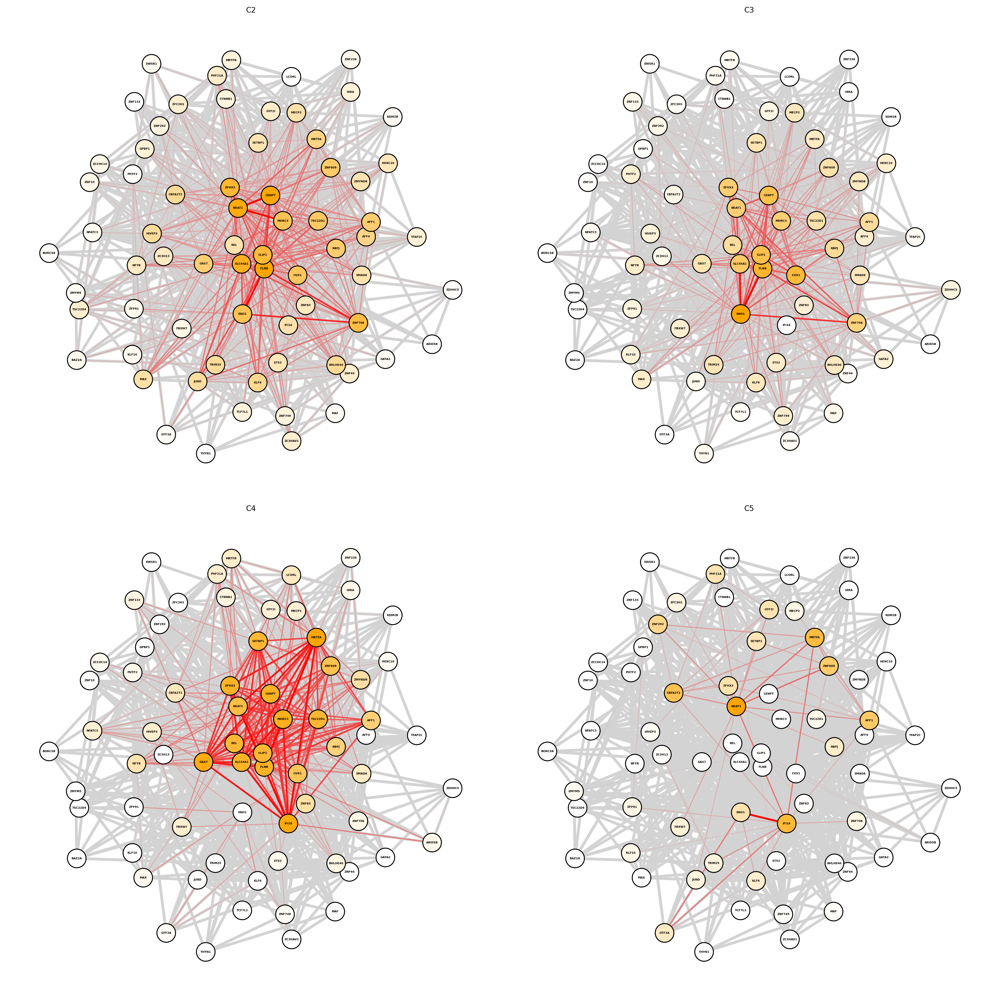

In [69]:
import networkx as nx
import numpy as np

def get_nth_order_top_degree_subgraph(
    G, query_node, n=1, top_pct=0.1, layout_seed=42, verbose=True
):
    """
    Returns the induced subgraph and layout for the top-degree nodes among
    the n-th order neighbors of query_node in G (undirected).

    Parameters
    ----------
    G : networkx.Graph or networkx.DiGraph
        Input graph (should be undirected, or will be converted).
    query_node : str or int
        Node of interest.
    n : int
        Order of neighborhood (steps from query_node).
    top_pct : float
        Fraction (0-1) of nodes with highest degree to keep (min 1 node).
    layout_seed : int
        Seed for layout reproducibility.
    verbose : bool
        If True, print status updates.

    Returns
    -------
    H : networkx.Graph
        Induced subgraph (undirected) of top-degree neighbors.
    pos : dict
        Layout dictionary for the subgraph.
    """
    # Ensure undirected
    if G.is_directed():
        G = G.to_undirected()
        if verbose:
            print("Converted input graph to undirected.")

    if query_node not in G:
        raise ValueError(f"Node '{query_node}' not found in graph.")

    # All nodes within n steps
    nodes = list(nx.single_source_shortest_path_length(G, query_node, cutoff=n).keys())
    if verbose:
        print(f"Found {len(nodes)} nodes within {n} steps of '{query_node}'.")

    H = G.subgraph(nodes).copy()
    if H.number_of_nodes() == 0:
        if verbose:
            print("Subgraph is empty after neighborhood extraction.")
        return None, {}

    # Compute degree and filter to top p%
    node_degrees = dict(H.degree())
    n_top = max(1, int(np.ceil(len(node_degrees) * top_pct)))
    top_nodes = sorted(node_degrees, key=node_degrees.get, reverse=True)[:n_top]
    if verbose:
        print(f"Selected top {n_top} nodes by degree (top {top_pct*100:.1f}%).")

    H = H.subgraph(top_nodes).copy()
    if H.number_of_nodes() > 0:
        largest_cc = max(nx.connected_components(H), key=len)
        H = H.subgraph(largest_cc).copy()
        if verbose:
            print(f"Subgraph reduced to largest connected component ({H.number_of_nodes()} nodes).")
        # pos = nx.spring_layout(H, seed=layout_seed)
        pos = graphviz_layout(H, prog='neato', args=f"-Gstart={layout_seed}")
    else:
        if verbose:
            print("Subgraph is empty after top-degree filtering.")
        pos = {}

    return H, pos

H, pos = get_nth_order_top_degree_subgraph(G, query_node="REL", top_pct=0.1, n=1)
print(H)
plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'], figsize=(15, 15))

# Plot the Fibroblast Network (Global)

Initial gene list from source='panglao', category='fibroblast': 232 genes
Filtered gene list (in graph): 213 genes


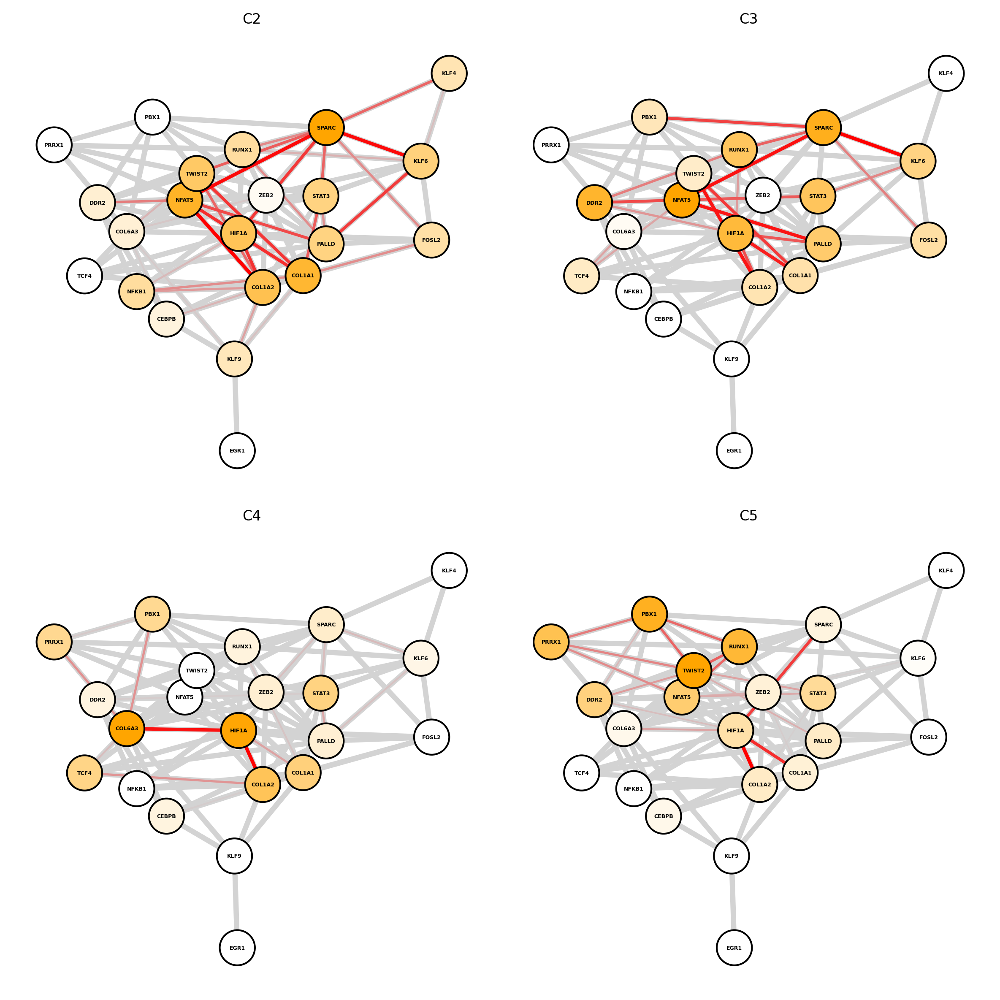

In [56]:
source = 'panglao'
category = 'fibroblast'

gene_list = mdf[(mdf['source'] == source) & (mdf['category'] == category)]['gene_name']
print(f"Initial gene list from source='{source}', category='{category}': {len(gene_list)} genes")

H, pos = get_top_degree_subgraph_and_layout_from_genes(
    G, gene_list,
    top_pct=0.1,
)

plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'], figsize=(8, 8))

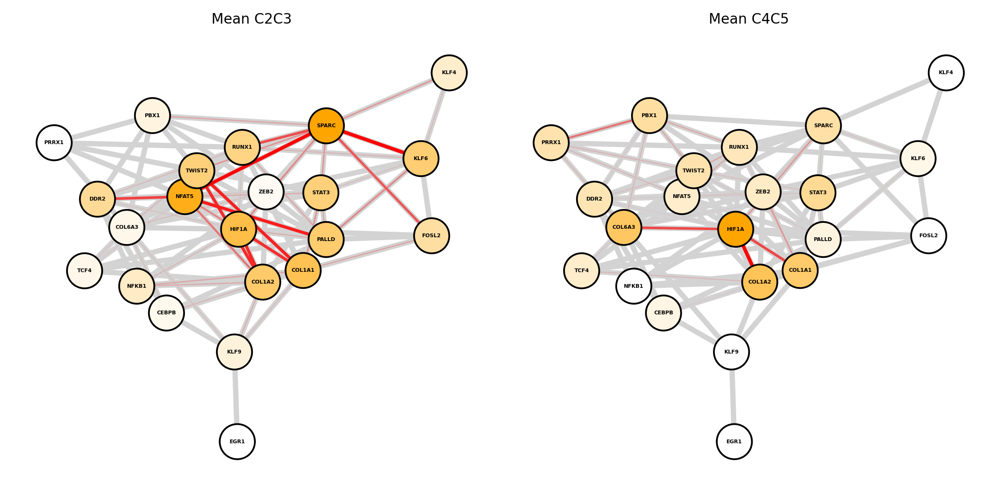

In [57]:
def add_group_averages_to_graph(H, group1=('C2', 'C3'), group2=('C4', 'C5')):
    """
    Adds mean node and edge attributes for group1 and group2 to the graph H.
    """
    g1_label = ''.join(group1)
    g2_label = ''.join(group2)

    # Nodes
    for n in H.nodes():
        vals1 = [H.nodes[n][f'mean_{g}'] for g in group1 if f'mean_{g}' in H.nodes[n]]
        vals2 = [H.nodes[n][f'mean_{g}'] for g in group2 if f'mean_{g}' in H.nodes[n]]
        H.nodes[n][f'mean_{g1_label}'] = np.mean(vals1) if vals1 else 0
        H.nodes[n][f'mean_{g2_label}'] = np.mean(vals2) if vals2 else 0

    # Edges
    for e in H.edges():
        vals1 = [H.edges[e].get(f'MI_{g}', 0) for g in group1]
        vals2 = [H.edges[e].get(f'MI_{g}', 0) for g in group2]
        H.edges[e][f'MI_{g1_label}'] = np.mean(vals1) if vals1 else 0
        H.edges[e][f'MI_{g2_label}'] = np.mean(vals2) if vals2 else 0

    return f'{g1_label}', f'{g2_label}'

def plot_group_averages_panel(H, pos, group1_label, group2_label):
    """
    Plots two panels for the averaged groups (group1_label and group2_label).
    """
    plt.rcParams['figure.dpi'] = 300
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    for i, label in enumerate([group1_label, group2_label]):
        edge_attr = f'MI_{label}'
        node_values, vmin, vmax = compute_node_values(H, edge_attr)
        draw_edges(H, pos, edge_attr, axes[i])
        draw_nodes_and_labels(H, pos, node_values, vmin, vmax, axes[i], f"Mean {label}")
    plt.tight_layout()
    plt.show()

# Add group averages to graph
g1_label, g2_label = add_group_averages_to_graph(H, group1=('C2','C3'), group2=('C4','C5'))

# Plot the two panels (mean of C2/C3 and mean of C4/C5)
plot_group_averages_panel(H, pos, g1_label, g2_label)

In [22]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# Endothelial

In [ ]:
H, pos = get_top_degree_subgraph_and_layout(
    G, mdf, source='panglao', category='endothelial', top_pct=0.10
)
plot_graph_plain(H, pos)
plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'])

In [ ]:
H, pos = get_top_degree_subgraph_and_layout(
    G, mdf, source='panglao', category='hematopoietic', top_pct=0.15
)
plot_graph_plain(H, pos)
plot_clusters_panel(H, pos, clusters=['C2', 'C3', 'C4', 'C5'])

In [ ]:
break

# Archive 

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize=(30, 30))
fig, axes = plt.subplots(2, 2)
axes = axes.ravel()

for i, cluster in enumerate(['C2', 'C3', 'C4', 'C5']):
    node_attr = f'mean_{cluster}'
    edge_attr = f'MI_{cluster}'
    
    # Custom colormap
    reds = plt.cm.get_cmap('Reds', 256)
    new_colors = reds(np.linspace(0, 1, 256))
    new_colors[-1] = [1.0, 0.0, 0.0, 1.0]
    bright_reds = mcolors.ListedColormap(new_colors)
    node_cmap = bright_reds
    
    # Node values for color
    node_values = np.array([H.nodes[n][node_attr] for n in H.nodes()])
    vmin, vmax = node_values.min(), node_values.max()
    
    # Draw all edges as thin grey lines
    nx.draw_networkx_edges(
        H, pos,
        edgelist=list(H.edges()),
        edge_color='lightgrey',
        width=2,
        arrows=False,
        ax=axes[i]
    )
    
    # Extract edges and weights for foreground plotting
    edges_with_weight = [(e, H.edges[e][edge_attr]) for e in H.edges() if H.edges[e][edge_attr] > 0]
    
    # Define custom colormap
    lightgrey_black = LinearSegmentedColormap.from_list('lightgrey_black', ['grey', 'black'])
    
    if edges_with_weight:
        # Sort edges by weight (low to high)
        edges_with_weight = sorted(edges_with_weight, key=lambda x: x[1])
        edgelist, edgeweights = zip(*edges_with_weight)
        k = 2.0 / max(edgeweights)  # Scale max width to ~10
        edgewidths = [k * w for w in edgeweights]
        nx.draw_networkx_edges(
            H, pos,
            edgelist=edgelist,
            edge_color=edgewidths,
            width=edgewidths,
            edge_cmap=lightgrey_black,
            alpha=1.0,
            arrows=False,
            ax=axes[i],
        )
    
    # Node centrality for color
    ec = nx.eigenvector_centrality(H, max_iter=1000, weight=edge_attr)
    node_values = np.array([ec[n] for n in H.nodes()])
    vmin, vmax = node_values.min(), node_values.max()
    
    # Draw nodes
    nx.draw_networkx_nodes(
        H, pos,
        node_color=node_values,
        node_size=200,
        cmap=node_cmap,
        edgecolors='black',
        linewidths=0.75,
        vmin=vmin,
        vmax=vmax,
        ax=axes[i],
    )
    
    # Draw labels
    nx.draw_networkx_labels(
        H, 
        pos, 
        font_size=3,
        font_weight='bold',
        ax=axes[i],
    )
    
    axes[i].set_title(f"{cluster}", fontsize=8)
    axes[i].axis('off')

plt.tight_layout()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Combine node attributes for mean
for n in H.nodes():
    H.nodes[n]['mean_C2C3'] = 0.5 * (H.nodes[n]['mean_C2'] + H.nodes[n]['mean_C3'])
    H.nodes[n]['mean_C4C5'] = 0.5 * (H.nodes[n]['mean_C4'] + H.nodes[n]['mean_C5'])

# Combine edge attributes for mean
for e in H.edges():
    H.edges[e]['MI_C2C3'] = 0.5 * (H.edges[e].get('MI_C2', 0) + H.edges[e].get('MI_C3', 0))
    H.edges[e]['MI_C4C5'] = 0.5 * (H.edges[e].get('MI_C4', 0) + H.edges[e].get('MI_C5', 0))

# Custom colormap for nodes (bright reds)
reds = plt.cm.get_cmap('Reds', 256)
new_colors = reds(np.linspace(0, 1, 256))
new_colors[-1] = [1.0, 0.0, 0.0, 1.0]
bright_reds = ListedColormap(new_colors)

# Custom colormap for edges (lightgrey to black)
lightgrey_black = LinearSegmentedColormap.from_list('lightgrey_black', ['grey', 'black'])

# Set up subplots
plt.rcParams['figure.dpi'] = 200
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

for idx, (cluster, node_attr, edge_attr, ax) in enumerate([
    ('C2/C3', 'mean_C2C3', 'MI_C2C3', axs[0]),
    ('C4/C5', 'mean_C4C5', 'MI_C4C5', axs[1])
]):
    # Node values for color
    node_values = np.array([H.nodes[n][node_attr] for n in H.nodes()])
    vmin, vmax = node_values.min(), node_values.max()

    # Draw all edges as thin grey lines
    nx.draw_networkx_edges(
        H, pos,
        edgelist=list(H.edges()),
        edge_color='lightgrey',
        width=3,
        arrows=False,
        ax=ax
    )

    # Extract edges and weights for foreground plotting
    edges_with_weight = [(e, H.edges[e][edge_attr]) for e in H.edges() if H.edges[e][edge_attr] > 0]
    if edges_with_weight:
        # Sort edges by weight (low to high)
        edges_with_weight = sorted(edges_with_weight, key=lambda x: x[1])
        edgelist, edgeweights = zip(*edges_with_weight)
        k = 3.0 / max(edgeweights)  # Scale max width to ~10
        edgewidths = [k * w for w in edgeweights]
        nx.draw_networkx_edges(
            H, pos,
            edgelist=edgelist,
            edge_color=edgewidths,
            width=edgewidths,
            edge_cmap=lightgrey_black,
            alpha=1.0,
            arrows=False,
            ax=ax
        )

    # Node centrality for color
    ec = nx.eigenvector_centrality(H, max_iter=1000, weight=edge_attr)
    node_values = np.array([ec[n] for n in H.nodes()])
    vmin, vmax = node_values.min(), node_values.max()

    nx.draw_networkx_nodes(
        H, pos,
        node_color=node_values,
        node_size=500,
        cmap=bright_reds,
        edgecolors='black',
        linewidths=1,
        vmin=vmin,
        vmax=vmax,
        ax=ax
    )

    nx.draw_networkx_labels(H, pos, font_size=4.5, font_weight='bold', ax=ax)
    ax.set_title(f"Mean Cluster {cluster}", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
break

# graph distances

In [ ]:
cluster_metrics = []

for name, sg in subgraphs.items():
    num_nodes = sg.number_of_nodes()
    num_edges = sg.number_of_edges()
    
    if num_nodes == 0: # Handle empty clusters
        density = 0
        avg_clustering = 0
        # Other metrics might be 0 or undefined
    else:
        density = nx.density(sg)
        avg_clustering = nx.average_clustering(sg) if num_nodes > 0 else 0
    
    # Add more metrics as needed:
    # avg_degree = sum(dict(sg.degree()).values()) / num_nodes if num_nodes > 0 else 0
    # Example: Average of a node attribute 'some_value'
    # avg_node_attr = sum(d['some_value'] for n, d in sg.nodes(data=True)) / num_nodes if num_nodes > 0 else 0
    
    metrics = {
        'Cluster': name,
        'MI_Score': mi_scores.get(name), # Get the pre-calculated MI score
        'Num_Nodes': num_nodes,
        'Num_Edges': num_edges,
        'Density': density,
        'Avg_Clustering_Coeff': avg_clustering,
        # 'Avg_Degree': avg_degree,
        # 'Avg_Custom_Node_Attr': avg_node_attr,
    }
    cluster_metrics.append(metrics)

# Create a Pandas DataFrame
df_comparison = pd.DataFrame(cluster_metrics)

In [ ]:
break

In [ ]:
break

In [ ]:
break